## Equação de Onda Acústica 2D Formulação Diferenças Finitas Explícita NSG 

__________________

$$ \nabla^2 p -\frac{1}{c²}\frac{\partial^2 p}{\partial t^2} = -\rho \ s(t)  $$

$$ \frac{\partial^2 p}{\partial t^2} = c^2\left(\frac{\partial^2 p}{\partial x^2} + \frac{\partial^2 p}{\partial z^2} \right) +c^2\rho \ s(t) \tag{1}$$

Equação (1) pode ser aproximada por diferenças finitas. Considerando quarta-ordem no espaço (x e z), segunda ordem no tempo (t). Os indices correspondentes são i, k e n respectivamente. 

$$ \frac{\partial^2 p}{\partial t^2} = \frac{p_{ik}^{n+1}-2p_{ik}^n+p_{ik}^{n-1}}{\Delta t^2}  $$

para x ou z:

$$ \frac{\partial^2 p}{\partial x^2} = \frac{-p_{i-2k}^n+16p_{i-1k}^n-30p_{ik}^n+16p_{i+1k}^n-p_{i+2k}^n}{12 \Delta x^2}  $$


Conectando das duas equações acima à (1), chegamos ao esquema de marcha abaixo:

$$ \frac{p_{ik}^{n+1}-2p_{ik}^n+p_{ik}^{n-1}}{\Delta t^2} = c^2\left(
\frac{-p_{i-2k}^n+16p_{i-1k}^n-30p_{ik}^n+16p_{i+1k}^n-p_{i+2k}^n}{12\Delta x^2} +
\frac{-p_{ik-2}^n+16p_{ik-1}^n-30p_{ik}^n+16p_{ik+1}^n-p_{ik+2}^n}{12 \Delta z^2}
 \right) +c^2\rho \ s^n $$
 
para $ \Delta x = \Delta z = \Delta s$ em um grid com velocidade $c_{ik}$ e densidade $\rho_{ik}$. Nos tempos n-1, n para calculo do tempo n+1.



$$ p_{ik}^{n+1} = \frac{\Delta t^2c_{ik}^2}{12h^2} \left( -p_{i-2k}^n+16p_{i-1k}^n+16p_{i+1k}^n-p_{i+2k}^n -p_{ik-2}^n+16p_{ik-1}^n+16p_{ik+1}^n-p_{ik+2}^n-60p_{ik}^n \right) +\Delta t^2 c_{ik}^2\rho \ s_{ik}^n +2p_{ik}^n-p_{ik}^{n-1}  $$

com $ \beta_h = \frac{\Delta t^2}{12h^2} $ e $ \rho = 1 $

$$ p_{ik}^{n+1} = \beta c_{ik}^2 \left[ -p_{i-2k}^n+16p_{i-1k}^n+16p_{i+1k}^n-p_{i+2k}^n -p_{ik-2}^n+16p_{ik-1}^n+16p_{ik+1}^n-p_{ik+2}^n-60p_{ik}^n \right] +\Delta t^2 c_{ik}^2 \ s_{ik}^n +2p_{ik}^n-p_{ik}^{n-1} \tag{2} $$

A equação (2) pode ser escrita como uma convolução notar:

$$ p_{ik}^{n+1} = \beta c_{ik}^2 p_{ik}^n  \circledast  
\begin{bmatrix} 
0 & 0 & -1 & 0 & 0\\
0 & 0 & 16 & 0 & 0\\
-1 & 16 & -60 & 16 & -1\\
0 & 0 & 16 & 0 & 0\\
0 & 0 & -1 & 0 & 0\\
\end{bmatrix}
+2p_{ik}^n-p_{ik}^{n-1} +\Delta t^2 c_{ik}^2 \ s_{ik}^n  $$



A convolução deve ser somente para região de "sobreposição" (overlap) completo  `(numpy 'valid' mode)`

Uma maneira mais elegante ainda e mais eficiente é separar em duas convoluções unidimensionais nos respectivos eixos. Notar os equivalentes  $ \beta_x = \frac{\Delta t^2}{12\Delta x^2} $ e $ \beta_z = \frac{\Delta t^2}{12\Delta z^2} $

$$ p_{ik}^{n+1} = \beta_z c_{ik}^2 p_{ik}^n  \circledast  
\begin{bmatrix} 
-1\\
16\\
-30\\
16\\
-1 \\
\end{bmatrix} 
+
\beta_x c_{ik}^2 p_{ik}^n  \circledast  [-1, 16, -30, 16, -1]   
+2p_{ik}^n-p_{ik}^{n-1} +\Delta t^2 c_{ik}^2 \ s_{ik}^n $$


Para uma fonte sísmica fase zero pode se utilizar uma Ricker com frequência central $f$:
 
 
$$ s(t) = A(1 - 2 \pi^2 f^2 t^2)exp(-\pi^2 f^2 t^2) \tag{3} $$

In [1]:
import numpy as np

In [2]:
(2*np.sqrt(np.pi))/20

0.1772453850905516

In [3]:
1./((2*20)/3*np.sqrt(np.pi))

0.04231421876608172

### Considerações para implementação:

Para garantir um espectro limitado com frequência máxima $f_{cut}$ (99.7 da amplitude) a $f$ central pode ser definida como:

$$        f = \frac{2f_{cut}}{3\sqrt{\pi}} $$

Para evitar criação de descontinuídades no tempo $t_0$ (e séria dispersão númerica!) é necessário aplicar a fonte $s(t)$ como uma fonte causal. Para isso a partir da frequência central $f$ aplica-se um delay em $t = t - t_d  $ baseado no perído da frequência dominante. 


$$  t_d = \frac{2\sqrt{\pi}}{fcut} $$

Para evitar dispersão numérica espacial é necessário que o grid seja capaz de amostrar o menor comprimento de onda sem falseamento. O menor comprimento de onda é dado por:  

$$ v = \lambda f \implies   \lambda = \frac{v}{f}  \implies \lambda_{min} = \frac{min ( c_{ik})}{max(f)} \implies \lambda_{min} = \frac{min ( c_{ik})}{f_{cut}} \tag{4} $$

Considerando um espaçamento entre os pontos do grid de $\Delta s$.
Tem-se que o maior comprimento de onda espacial amostrado sem falseamento é definido por Nyquest:    
    
$$ K_{Nyquest} = \frac{1}{2\Delta s} $$

Assim no grid:

$$ K_{\lambda_{min}} \lt K_{Nyquest} \implies  \frac{1}{\lambda_{min}}  \lt \frac{1}{2\Delta s}  $$

$$ \Delta s  \lt \frac{1}{2} \lambda_{min} $$ 


**From Alford 1974**  
Na prática é necessário valores bem menores de $\Delta s$ ??? (R.M, Alford. 1974), define-se o número mínimo de pontos para representar o menor comprimento de onda . Nota para discutir Alford. não usa $f_{cut}$ usa uma frequẽncia que ainda está bem longe da $f_{cut}$ de sua fonte !!? 

1. Segunda ordem espacial 
$$ \Delta s \lt \frac{\lambda_{min}}{10} $$
2. Quarta ordem espacial 
$$ \Delta s \lt \frac{\lambda_{min}}{5} \tag{5}$$

Finalmente para garantir que o erro entre os passos em tempo não cresça exponencial a analise de Von Newman define para um esquema de **4 ordem no espaço e segunda ordem no tempo** (Chen, Jing-Bo 2011):

$$
     \Delta t \leq \frac{2 \Delta s}{ V \sqrt{\sum_{a=-N}^{N} (|w_a^1| + |w_a^2|)}} \leq \frac{ \Delta s \sqrt{3}}{ c_{max} \sqrt{8}} \tag{6}
$$

Onde $w_a$ são os pesos das diferenças finitas.

Uma nota final Alford mostra que $\Delta t$ quanto mais próximo do limite de estabilidade numérica menor é o erro da solução (dispersão numérica).

Referencias:  
1. Alford R.M., Kelly K.R., Boore D.M. (1974) Accuracy of
finite-difference modeling of the acoustic wave equation
Geophysics, 39 (6), P. 834-842  
2. Chen, Jing-Bo (2011) A stability formula for Lax-Wendroff methods
with fourth-order in time and general-order in space for
the scalar wave equation Geophysics, v. 76, p. T37-T42
Convergence  

Leandro critério de tempo $ \Delta t \lt \frac{ \Delta s }{  4 c_{max}} $

### Condição de Absorção : interfaces laterais e inferior

#### 1. Equação one way 1D scalar (primera ordem no tempo)

Essa equação de propagação de onda não permite reflexões. Ela modela uma onda que proga-se em um sentido único: somente para frente ou somente para trás. Assumindo o eixo x positivo para direita, o sinal negativo na equação abaixo ela proga-se para esquerda.

$$ \frac{dp}{dx} \pm \frac{1}{c} \frac{dp}{d t} = 0 \tag{7} $$

Discretizando a equação por diferenças finitas (primeira ordem), assumindo i como indice do eixo x chega-se em:

$$ \frac{d p}{d t} = \frac{p_{i}^{n+1}-p_{i}^{n}}{\Delta t}  $$

$$ \frac{d p}{d x} = \frac{p_{i+1}^{n}-p_{i}^{n}}{\Delta x}  $$

Conectando as duas equações: 

$$ \frac{p_{i+1}^{n}-p_{i}^{n}}{\Delta x} + \frac{1}{c}\frac{p_{i}^{n+1}-p_{i}^{n}}{\Delta t} =0 $$


$$ \frac{p_{i+1}^{n}-p_{i}^{n}}{\Delta x} - \frac{1}{c}\frac{p_{i}^{n+1}-p_{i}^{n}}{\Delta t} =0 $$

Propagando-se para a **esquerda**, upwind estavel para $ 0 \le r \le 1 $ com $ r = \frac{c\Delta t}{\Delta x} $:

$$  p_{i}^{n+1} =  p_{i}^{n} + \frac{c\Delta t}{\Delta x} \left(p_{i+1}^{n}-p_{i}^{n}\right)  \tag{8} $$

Onda para a **direita**:

$$  p_{i}^{n+1}  = p_{i}^{n} - \frac{c\Delta t}{\Delta x} \left(p_{i}^{n}-p_{i-1}^{n}\right) \tag{9} $$

Sobre a mudanca de indice verificar em https://en.wikipedia.org/wiki/Upwind_scheme, sobre estabilidade do upwind.

$$ \qquad \qquad a^+ = \text{max}(a,0)\,, \qquad a^- = \text{min}(a,0) $$

$$ \qquad \qquad u_x^- = \frac{u_i^{n} - u_{i-1}^{n}}{\Delta x}\,, \qquad u_x^+ = \frac{u_{i+1}^{n} - u_{i}^{n}}{\Delta x} $$

 $$ \quad  \qquad u_i^{n+1} = u_i^n - \Delta t \left[ a^+ u_x^- + a^- u_x^+ \right] $$
 
Ordens superiores de discritização da equação de advecação não suportam variações abrutas de pressão como bordas. E somente funcionam bem para condições inicias suaves como uma progação de um pulso gaussiano que já se encontra presente em t=0. Isso experimentei e testei inclusive o método Lax-Wendroff.

#### 2. Reynolds One Way (segunda ordem no tempo)

Usa equações discretizadas por Reynolds, A. C. - Boundary conditions for numerical solution of wave propagation problems Geophysics p 1099-1110 - 1978

Discretização das equações **18d, 18e, 18f** do artigo.

Para **esquerda**:

$$ p_{i}^{n+1} = p_{i}^{n} + p_{i+1}^{n} - p_{i+1}^{n-1} + \frac{c\Delta t}{\Delta x} \left(p_{i+1}^{n}-p_{i}^{n}-p_{i+2}^{n-1} + p_{i+1}^{n-1} \right)  \tag{10}$$

Deve ser aplicado em `i` primeiro `0` depois em `1`

Para **direita**:

$$ p_{i}^{n+1} = p_{i}^{n} + p_{i-1}^{n} - p_{i-1}^{n-1} -
\frac{c\Delta t}{\Delta x} \left( -p_{i-1}^{n} + p_{i}^{n} + p_{i-2}^{n-1} - p_{i-1}^{n-1}  \right)  \tag{11}$$

Deve ser aplicado em `i` primeiro `n-1` depois em `n-2`

### 2. Damping Cerjan

Basedo no artigo de Cerjan 1985.  
*A nonreflecting boundary condition for discrete acoustic and elastic wave equations*  

O campo de ondas é multiplicado por uma fator exponencial negativo em uma região extendida das bordas.

Esquerda:




In [4]:
%matplotlib inline

In [5]:
from matplotlib import pyplot as plt
import matplotlib.animation
import matplotlib
import numpy as np
from numba import njit, prange

## Implementação

#### Loop simples

In [6]:
@njit(parallel=True)
def stepScalar(u_tp1, u_t, u_tm1, c, x1, x2, z1, z2, dx, dz, dt):
    """
    Perform a single time step in the Finite Difference solution for scalar
    waves 4th order in space
    """    
    cdz = (dt/dz)**2
    cdx = (dt/dx)**2

    for i in prange(z1, z2):
        for j in prange(x1, x2):
            u_tp1[i,j] = (2.*u_t[i,j] - u_tm1[i,j]
                + (c[i,j]**2)*(
                    cdx*(-u_t[i,j + 2] + 16.*u_t[i,j + 1] - 30.*u_t[i,j] +
                    16.*u_t[i,j - 1] - u_t[i,j - 2])/12. +
                    cdz*(-u_t[i + 2,j] + 16.*u_t[i + 1,j] - 30.*u_t[i,j] +
                    16.*u_t[i - 1,j] - u_t[i - 2,j])/12.))    

#### Absorção 1 ordem

In [7]:
@njit(parallel=True)
def nonreflexive1st(u_tp1, u_t, c, nx, nz, dx, dz, dt):
     
    # Aplica à esquerda onda que vai para esquerda somente    
    for k in range(nz): # a linha vai para baixo
        # i = [0, 1]
        u_tp1[k, 0] = u_t[k, 0] + (c[k, 0]*dt/dx)*(u_t[k, 1]-u_t[k, 0])    
        u_tp1[k, 1] = u_t[k, 1] + (c[k, 1]*dt/dx)*(u_t[k, 2]-u_t[k, 1])  
        # Aplica a direita onda que vai para direita somente    
        # i = [nx-2, nx-1]   
        u_tp1[k, nx-1] = u_t[k, nx-1] - (c[k, nx-1]*dt/dx)*(u_t[k, nx-1]-u_t[k, nx-2]) 
        u_tp1[k, nx-2] = u_t[k, nx-2] - (c[k, nx-2]*dt/dx)*(u_t[k, nx-2]-u_t[k, nx-3])  
        
    # onda que vai para baixo somente 
    for i in range(nx): # a linha vai para direita
    # i = [nz-2, nz-1]  
        u_tp1[nz-1, i] = u_t[nz-1, i] - (c[nz-1, i]*dt/dz)*(u_t[nz-1, i]-u_t[nz-2, i])
        u_tp1[nz-2, i] = u_t[nz-2, i] - (c[nz-2, i]*dt/dz)*(u_t[nz-2, i]-u_t[nz-3, i])          


##### Absorção 2 ordem

In [8]:
@njit(parallel=True)
def nonreflexive2nd(u_tp1, u_t, u_tm1, c, nx, nz, dx, dz, dt):
    """
    Apply the boundary conditions: free-surface at top, transparent in the borders
    4th order (+2-2) indexes
    Uses Reynolds, A. C. - Boundary conditions for numerical solution of wave propagation problems
    Geophysics p 1099-1110 - 1978
    We apply 1D reynolds at -2/-1 and +2/+1 respectively
    """
    for i in range(nz):
        # left
        for p in range(2):
                u_tp1[i, p] = ( u_t[i, p] + u_t[i, p+1] - u_tm1[i,p+1] +
                (c[i, p]*dt/dx)*(u_t[i, p+1] - u_t[i, p] - u_tm1[i, p+2] + u_tm1[i, p+1])
                )
        #right
        for p in range(2):
            p = 1-p            
            u_tp1[i, nx-2+p] = ( u_t[i, nx-2+p] + u_t[i, nx-3+p] - u_tm1[i, nx-3+p] -
                (c[i, nx-2+p]*dt/dx)*(u_t[i, nx-2+p] - u_t[i, nx-3+p] - u_tm1[i, nx-3+p] + u_tm1[i, nx-4+p])
                )
    # Down
    for i in range(nx):
        for p in range(2):
            p = 1-p
            u_tp1[nz-2+p, i] = ( u_t[nz-2+p, i] + u_t[nz-3+p, i] - u_tm1[nz-3+p, i] -
                    (c[nz-2+p, i]*dt/dz)*(u_t[nz-2+p, i] - u_t[nz-3+p, i] - u_tm1[nz-3+p, i] + u_tm1[nz-4+p, i])
                    )

##### Damping Cerjan

$$ e^{-\alpha(i-nx)} $$

Text(0.5, 0, 'grid points')

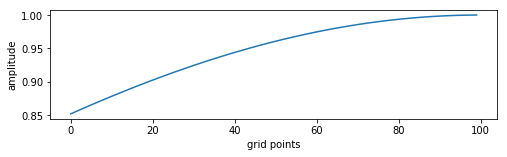

In [9]:
decay=0.004
pad=100
ix = np.arange(0, pad)
plt.figure(figsize=(8,2))
plt.plot(ix, np.exp(-(decay*(pad-ix))**2))
plt.ylabel('amplitude')
plt.xlabel('grid points')

In [10]:
@njit(parallel=True)
def applyDamping(array, nx, nz, pad, decay):
    """
    Apply a decay factor to the values of the array in the padding region.
    """
    # Damping on the left
    for i in prange(nz):
        for j in range(pad):
            array[i,j] *= np.exp(-((decay*(pad - j))**2))
    # Damping on the right
    for i in prange(nz):
        for j in range(nx - pad, nx):
            array[i,j] *= np.exp(-((decay*(j - nx + pad))**2))
    # Damping on the bottom
    for i in prange(nz - pad, nz):
        for j in range(nx):
            array[i,j] *= np.exp(-((decay*(i - nz + pad))**2))

# Simulation Loop

In [11]:
%%time

from scipy.signal import fftconvolve

def ricker(t, td, f):
    """amplitude unitária"""
    t = (t - td)
    aux = (1 - 2*(np.pi*f*t)**2)
    return aux*np.exp(-(np.pi*f*t)**2)

def params(fcut, c):
    """
    A partir da frequencia máxima na fonte `fcut` e do 
    campo de velocidades `c` calcula:
    ds, f central, t delay, dt time step
    """    
    # fcut máxima frequência na fonte
    f = 2*fcut/(3*np.sqrt(np.pi)) # f central
    td = 2*np.sqrt(np.pi)/fcut # time delay  
    lmin = np.min(c)/fcut # lambda min
    ds = 0.9*lmin/5. # espaçamento grid evitar alias espacial 
    dt = (1-1e-4)*ds*np.sqrt(3)/(np.sqrt(8)*np.max(c))  # "quaaase" no limite (menor erro)
    return ds, f, td, dt

n = 100 # grid dimensao
nx, nz = n, n
npad = 40 # regiao absorcao
# segunda ordem no espaço stencial requer +2+2 pontos cada dimensao
# padding *2 cada dimensao
nx += 2*2 + npad*2 
nz += 2*2 + npad*2

c = np.ones((nz, nx))*1500. # àgua
# campos de pressao em n e n+1 ou n-1
p = np.zeros((2, nz, nx)) # n e n+1 ou n-1
# parametros da simulacao fonte de x0 Hz no máxxximoo...
ds, f, td, dt = params(30., c)
# numero de iteracoes a partir de duracao da simulacao
duracao = 1.550 # segundo
nt = int(duracao/dt)

# posicao fonte
si, sk = 50, 10
kernel = np.array([[ 0,  0,  -1,  0,  0],
                   [ 0,  0,  16,  0,  0], 
                   [-1, 16, -60, 16, -1],
                   [ 0,  0,  16,  0,  0],
                   [ 0,  0,  -1,  0,  0]]) # diferenciador convolucional  

# simplicar contas loop
beta = dt/ds

snaps = []
for i in range(nt):
    # para evitar um painel a mais : pilha de paineis 
    t, tm1 = i%2, (i+1)%2
    tp1 = tm1  
    
    #nonreflexive1st(p[tp1], p[t], c, dt, ds, ds)
    nonreflexive2nd(p[tp1], p[t], p[tm1], c, nx, nz, ds, ds, dt)
    
    # convolucao descomentar somente isso e comentar o stepScalar
    #p[tp1, 2:-2, 2:-2] = ((1./12.)*(beta*c[2:-2,2:-2])**2*fftconvolve(kernel, p[t], mode='valid')
    #                      +2*p[t, 2:-2,2:-2] - p[tm1, 2:-2,2:-2])    
    
    stepScalar(p[tp1], p[t], p[tm1], c, 2, nx-2, 2, nz-2, ds, ds, dt)
    
    applyDamping(p[tm1], nx, nz, npad, 0.004)
    applyDamping(p[t], nx, nz, npad, 0.004)  
    
    p[tp1, npad+2+sk, npad+2+si] -= ((c[npad+2+sk, npad+2+si]*dt)**2)*ricker(i*dt, td, f)  
    
    if i%1==0:
        snaps.append(p[t].copy())   
        
        
print('Ds: ', ds, 'f. central :', f, 'delay : ', td, 'dt: ',  dt, ' nt: ', nt)

Ds:  9.0 f. central : 11.283791670955125 delay :  0.11816359006036772 dt:  0.003673867190713349  nt:  421
CPU times: user 2.82 s, sys: 141 ms, total: 2.96 s
Wall time: 2.49 s


In [12]:
import matplotlib
import matplotlib.animation

snaps = np.array(snaps)
pmin = np.percentile(snaps, [1])
ext = [0, nz*ds, nx*ds, 0]

fig = plt.figure(figsize=(7,7))
im = plt.imshow(snaps[0,:,:], cmap='gray_r', interpolation='none', vmin=-pmin, vmax=pmin, extent=ext, alpha=0.7)
# boundary without cerjan absortion
#plt.plot([npad*ds, (nx-npad)*ds], [npad*ds, npad*ds], 'b') # up
plt.plot([npad*ds, npad*ds], [(nz-npad)*ds, 0], 'b') # left
plt.plot([(nz-npad)*ds, (nx-npad)*ds], [0, (nx-npad)*ds], 'b') # right
plt.plot([npad*ds, (nx-npad)*ds], [(nz-npad)*ds, (nx-npad)*ds], 'b') # bellow
plt.colorbar(im,  shrink=0.7, pad = 0.07, label=u'amplitude')
plt.xlabel('x (m)')
plt.ylabel('z (m)')
title = plt.title(u'Campo de Pressão')
#sns.despine()
plt.tight_layout()
plt.close()

def animate(i):
    im.set_data(snaps[i, :,:])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=snaps.shape[0])

from IPython.display import HTML
HTML(ani.to_jshtml())

### First order one way vs second order  

#### Get sismograms at (z=25, x=25) ignore first 125 samples direct wave

In [13]:
#seismogram1st = snaps[:,2+25,2+25]
seismogram2nd = snaps[:,2+25,2+25]

In [ ]:
plt.figure(figsize=(10,4))
plt.plot(seismogram1st[125:], 'g', label='reynolds 1st')
plt.plot(seismogram2nd[125:], 'k', label='reynolds 2nd')
plt.legend()

### Equação One Way 1D - Advection Equation - first order

$$ \frac{p_{i+1}^{n}-p_{i}^{n}}{\Delta x} - \frac{1}{c}\frac{p_{i}^{n+1}-p_{i}^{n}}{\Delta t} =0 $$

Propagando-se para a esquerda, upwind estavel para $ 0 \le r \le 1 $ com $ r = \frac{c\Delta t}{\Delta x} $:


$$ p_{i}^{n} + \frac{c\Delta t}{\Delta x} \left(p_{i+1}^{n}-p_{i}^{n}\right) =  p_{i}^{n+1} $$

Onda para a direita:

$$ p_{i}^{n} - \frac{c\Delta t}{\Delta x} \left(p_{i}^{n}-p_{i-1}^{n}\right) =  p_{i}^{n+1} $$

Sobre a mudanca de indice olhar em https://en.wikipedia.org/wiki/Upwind_scheme, sobre estabilidade do upwind.

$$ \qquad \qquad a^+ = \text{max}(a,0)\,, \qquad a^- = \text{min}(a,0) $$

$$ \qquad \qquad u_x^- = \frac{u_i^{n} - u_{i-1}^{n}}{\Delta x}\,, \qquad u_x^+ = \frac{u_{i+1}^{n} - u_{i}^{n}}{\Delta x} $$

 $$ \quad  \qquad u_i^{n+1} = u_i^n - \Delta t \left[ a^+ u_x^- + a^- u_x^+ \right] $$

### Second-order upwind scheme

P/ c < 0 $u_x^+$ p/ c > 0 $ u_x^- $ 

The spatial accuracy of the first-order upwind scheme can be improved by including 3 data points instead of just 2, which offers a more accurate finite difference stencil for the approximation of spatial derivative. For the second-order upwind scheme, <math>u_x^-</math> becomes the 3-point backward difference in equation (3) and is defined as 
$$
  \qquad \qquad u_x^- = \frac{3u_i^n - 4u_{i-1}^n + u_{i-2}^n}{2\Delta x}
$$
and $u_x^+$ is the 3-point forward difference, defined as 
$$
  \qquad \qquad u_x^+ = \frac{-u_{i+2}^n + 4u_{i+1}^n - 3u_i^n}{2\Delta x}
$$
This scheme is less diffusive compared to the first-order accurate scheme and is called linear upwind differencing (LUD) scheme.


In [ ]:
# parametros da simulacao fonte de 20 Hz no máxxximoo...
ds, f, td, dt = params(15., np.ones(100)*1500.)

In [ ]:
1500*dt/ds

In [ ]:
# somente para direita com np.diff para a esquerda não sei fazer com np.diff
p = np.zeros(N)
aux = np.ones(N)
snaps = []
for i in range(100):
    for j in range(N-3):
#         # 1 ordem no espaco
#         # para a esquerda 0, N-1, c negative
#         aux[j] = ( (1500.*dt/ds)*(p[j+1]-p[j]) + p[j] )
#         # para a direita 
#         #aux[j] = ( -(1500.*dt/ds)*(p[j]-p[j-1]) + p[j] )        
#         # segunda ordem no espaco
        aux[j] = ( (0.5*1500.*dt/ds)*(-p[j+2]+4*p[j+1]-3*p[j]) + p[j] )
    
    p[:] = aux[:]
    p[80] -= ricker(i*dt, td, f)*1500*dt  
    snaps.append(p.copy())
    
snaps = np.array(snaps)

In [ ]:
ymin, ymax = np.min(snaps), np.max(snaps)
fig = plt.figure()
sub = fig.add_subplot(111)
ax = sub.plot(np.arange(N), snaps[0])
sub.set_ylim(ymin, ymax)

plt.xlabel('x')
plt.ylabel('amplitude ')
title = plt.title(u'Equação One Way')
plt.tight_layout()
plt.close()

def animate(i):
    ax[0].set_ydata(snaps[i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=snaps.shape[0])

from IPython.display import HTML
HTML(ani.to_jshtml())